<a id="import"></a>
# <p style="background-color:#040404; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:20px 30px;"> Deep Fake Detection </p>


<div style="border-radius:12px; padding: 20px; background-color: #2E86C1; font-size:125%; text-align:left">

<h2 align="left"><font color=#F4F6F7>Introduction: </font></h2>  
    
<p align="left"><font color=#F4F6F7>
      The photo fake detection model is an advanced computer tool designed to detect any unauthorized modifications or changes made to a person's photo. This type of model relies on artificial intelligence techniques, such as deep learning, to analyze images with high accuracy and recognize subtle signs that indicate image tampering.
      
<h3 align="left"><font color=#F4F6F7>Model Containt: </font></h3>
    
1) Getting The Data Sets & Data Exportary EDA
2) Data PreProcessing &  Data Prepration
3) Create 3 Hybrid Models Training
4) Model Evalution and Visualization
5) Application


 </font></p>

In [23]:
import psutil

def get_memory_usage():
    process = psutil.Process()
    mem_usage = process.memory_info().rss / (1024 * 1024)
    return f"Memory usage: {mem_usage:.2f} MB"

print(get_memory_usage())

Memory usage: 3460.18 MB


<a id="import"></a>
# <p style="background-color:#040404; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  Step 1 | Getting The Data Sets and Exploration  </p>



In [2]:
import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy  as np
import cv2
import matplotlib.pyplot as plt
import matplotlib.pyplot as mpimg
import plotly.express as px
from PIL import Image
from tqdm import tqdm_notebook
import os
import time
import csv

import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import accuracy_score
from scipy import special
from scipy.stats import multivariate_normal

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, Conv2D, MaxPooling2D
from tensorflow.keras.utils import to_categorical

from tensorflow.keras.layers import Input, Add
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import LearningRateScheduler, EarlyStopping
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from keras.layers import Dropout, BatchNormalization
from keras.callbacks import ModelCheckpoint
from sklearn.preprocessing import LabelEncoder
from tensorflow.keras import layers, Model
from tensorflow.keras.utils import to_categorical
import seaborn as sns
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score
from keras.models import Model
from sklearn.metrics import roc_curve, auc, accuracy_score


from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.regularizers import l2
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau

import warnings
warnings.filterwarnings('ignore')

import pandas as pd
import numpy as np
import cv2
import matplotlib.pyplot as plt
import os
import time
import csv

import torch
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import VotingClassifier
from sklearn.metrics import accuracy_score
from keras.applications.vgg16 import VGG16, preprocess_input as vgg16_preprocess
from keras.applications.mobilenet import MobileNet, preprocess_input as mobilenet_preprocess
from keras.models import Model
from skimage.feature import hog
from skimage import exposure

# Define the paths to the real and fake image directories
train_real_dir = r"C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\Real"  # Real images label = 0
train_fake_dir = r"C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\Fake"  # Fake images label = 1

# Initialize lists to store the images and their labels
train_images = []
train_labels = []

# Load real images and their labels
for filename in os.listdir(train_real_dir):
    img_path = os.path.join(train_real_dir, filename)
    if os.path.isfile(img_path):  # Ensure it's a file
        img = cv2.imread(img_path)
        if img is not None:  # Ensure the image was read correctly
            train_images.append(img)
            train_labels.append(0)  # Label for real images is 0

# Load fake images and their labels
for filename in os.listdir(train_fake_dir):
    img_path = os.path.join(train_fake_dir, filename)
    if os.path.isfile(img_path):  # Ensure it's a file
        img = cv2.imread(img_path)
        if img is not None:  # Ensure the image was read correctly
            train_images.append(img)
            train_labels.append(1)  # Label for fake images is 1

# Create a DataFrame from the loaded images and labels
train_label = pd.DataFrame({
    'img_name': [os.path.basename(filename) for filename in os.listdir(train_real_dir)] + 
                [os.path.basename(filename) for filename in os.listdir(train_fake_dir)],
    'target': train_labels
})

# Write metadata to CSV
csv_path = r'C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\file_path6.csv'

# Ensure the 'target' column is of the correct data type
train_label['target'] = train_label['target'].astype(int)

# Construct the 'path' column based on the 'target' column
train_label['path'] = train_label.apply(
    lambda row: os.path.join(train_real_dir, row['img_name']) 
    if row['target'] == 0 
    else os.path.join(train_fake_dir, row['img_name']), 
    axis=1
)

# Save the DataFrame to a CSV file
train_label.to_csv(csv_path, index=False)

# Print first 10 rows for verification
train_label.head(10)

,img_name,target,path
0,flipped_light_changed_denoised_0153c9774226783...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
1,flipped_light_changed_denoised_0153ffdc5f8ef00...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
2,flipped_light_changed_denoised_0211264ddfc7c02...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
3,flipped_light_changed_denoised_079740a0c371852...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
4,flipped_light_changed_denoised_106559e4631d010...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
5,flipped_light_changed_denoised_106d12b0ee16032...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
6,flipped_light_changed_denoised_108be6e749fe16a...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
7,flipped_light_changed_denoised_122e01650de7e6e...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
8,flipped_light_changed_denoised_123ff54db49301e...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...
9,flipped_light_changed_denoised_13029625e1df71b...,0,C:\Users\islam\Downloads\AI Work\deepfake\Yolo...


In [2]:
print("Data Shape : ", train_label.shape)
print("Data Size : ", train_label.size)
print("Data Count : ", train_label['target'].value_counts())
train_label.info()

Data Shape :  (4180, 3)
Data Size :  12540
Data Count :  target
0    2102
1    2078
Name: count, dtype: int64
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4180 entries, 0 to 4179
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   img_name  4180 non-null   object
 1   target    4180 non-null   int32 
 2   path      4180 non-null   object
dtypes: int32(1), object(2)
memory usage: 81.8+ KB


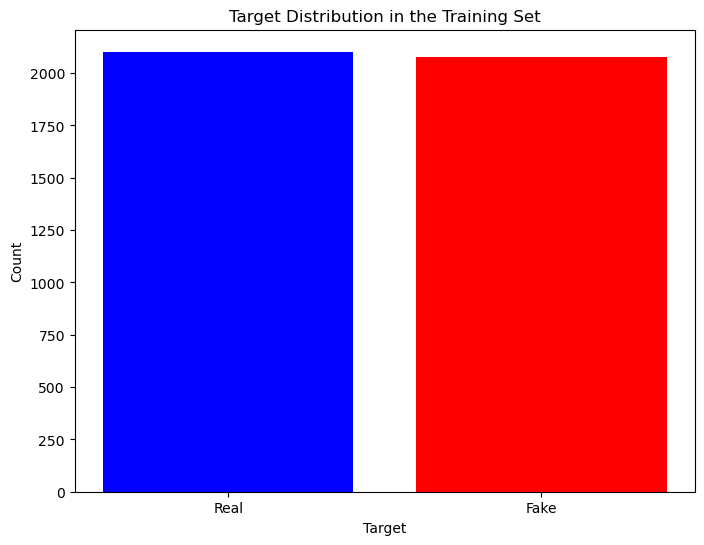

In [18]:
train_set = train_label.copy()
train_set['target'] = train_set['target'].replace({0: 'Real', 1: 'Fake'})

# Count the number of each target class
target_counts = train_set['target'].value_counts().reset_index()

# Rename the columns
target_counts.columns = ['Target', 'Count']

# Create a bar chart
plt.figure(figsize=(8, 6))
plt.bar(target_counts['Target'], target_counts['Count'], color=['blue' if target == 'Real' else 'red' for target in target_counts['Target']])
plt.xlabel('Target')
plt.ylabel('Count')
plt.title('Target Distribution in the Training Set')
plt.xticks(['Real', 'Fake'])

# Display the plot
plt.show()

# Display Images Real Vs FAke

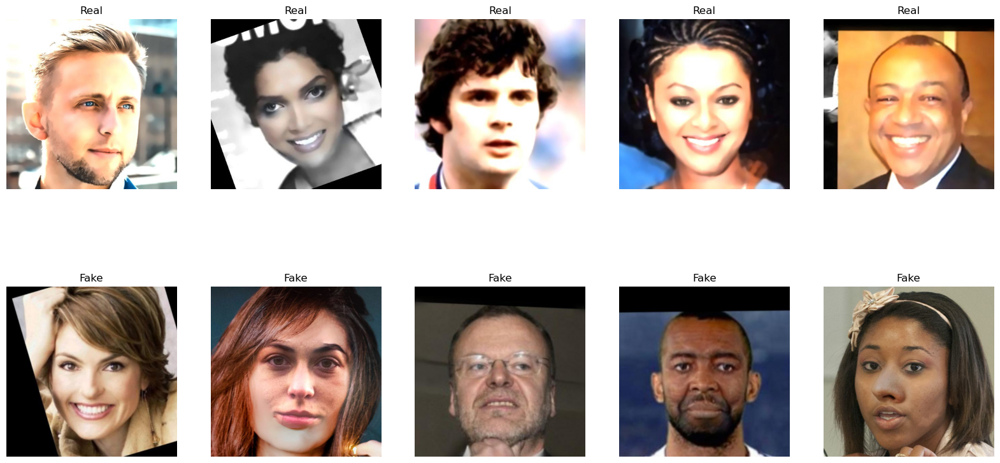

In [6]:
# if U want Open one image
#   from PIL import Image
#   img = Image.open('image.jpeg')
#   plt.imshow(img)

# Filter the dataframe to get only Real and Fake images
real_images = train_set[train_set['target'] == 'Real']
fake_images = train_set[train_set['target'] == 'Fake']

# Create a figure with 2 subplots
fig, axs = plt.subplots(2, 5, figsize=(20, 10))

# Plot the Real images
for i, row in enumerate(real_images.sample(5).itertuples()):
    img_path = row.path
    img = mpimg.imread(img_path)
    # Normalize pixel values
    img = img / 255.0
    axs[0, i].imshow(img)
    axs[0, i].set_title('Real')
    axs[0, i].axis('off')

# Plot the Fake images
for i, row in enumerate(fake_images.sample(5).itertuples()):
    img_path = row.path
    img = mpimg.imread(img_path)
    # Normalize pixel values
    img = img / 255.0
    axs[1, i].imshow(img)
    axs[1, i].set_title('Fake')
    axs[1, i].axis('off')

# Show the plot
plt.show()

# 1) This code displays real images and fake images after applying the “Gradient Edges Gray Scaler” filter, which converts the images to grayscale and highlights the edges to help analyze the image¶

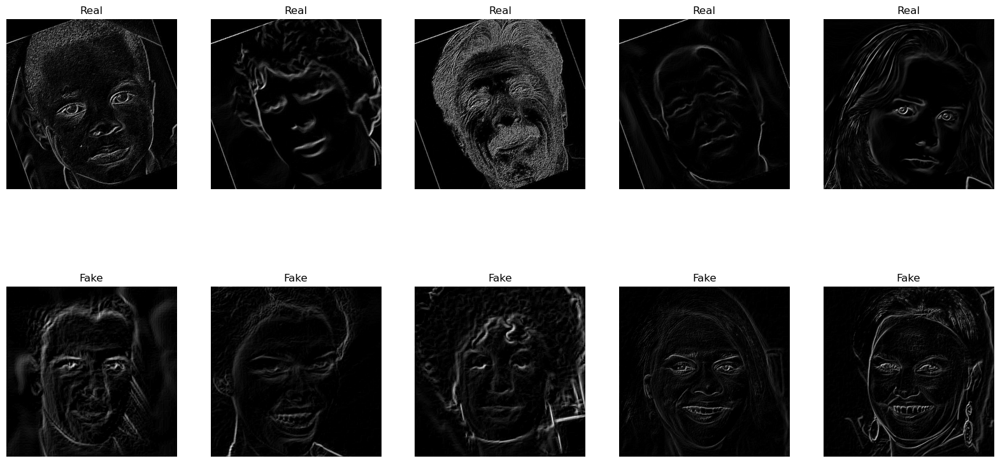

In [2]:
class ImageProcessor:
    def __init__(self, normalization_technique='divide_by_255'):
        self.normalization_technique = normalization_technique

    def load_and_normalize_image(self, img_path):
        """Load an image and normalize its pixel values"""
        img = mpimg.imread(img_path)
        if self.normalization_technique == 'divide_by_255':
            return img / 255.0
        else:
            raise ValueError("Invalid normalization technique")

    def apply_gradient_edges_gray_scaler(self, img):
        """Apply Gradient Edges Gray Scaler to an image"""
        # Convert image to grayscale
        gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        
        # Apply Sobel operator to detect edges
        grad_x = cv2.Sobel(gray, cv2.CV_8U, 1, 0, ksize=3)
        grad_y = cv2.Sobel(gray, cv2.CV_8U, 0, 1, ksize=3)
        
        # Combine edges
        grad = cv2.addWeighted(grad_x, 0.5, grad_y, 0.5, 0)
        
        return grad / 255.0

class ImagePlotter:
    def __init__(self):
        pass

    def plot_images(self, axs, images, title, normalization_technique='divide_by_255'):
        """Plot a list of images on a set of axes"""
        image_processor = ImageProcessor(normalization_technique)
        for i, img_path in enumerate(images.sample(5)['path']):
            img = image_processor.load_and_normalize_image(img_path)
            img = image_processor.apply_gradient_edges_gray_scaler(img)  # Apply Gradient Edges Gray Scaler
            axs[i].imshow(img, cmap='gray')  # Display as grayscale image
            axs[i].set_title(title)
            axs[i].axis('off')

class ImageDisplayer:
    def __init__(self):
        pass

    def display_real_and_fake_images(self, real_images, fake_images):
        """Display Real and Fake images in a 2x5 subplot"""
        fig, axs = plt.subplots(2, 5, figsize=(20, 10))
        image_plotter = ImagePlotter()
        image_plotter.plot_images(axs[0], real_images, 'Real')
        image_plotter.plot_images(axs[1], fake_images, 'Fake')
        plt.show()

# Filter the dataframe to get only Real and Fake images
Gradient_Edges_Gray_Scaler = train_label.copy()
Gradient_Edges_Gray_Scaler['target'] = Gradient_Edges_Gray_Scaler['target'].replace({0: 'Real', 1: 'Fake'})

real_images = Gradient_Edges_Gray_Scaler[Gradient_Edges_Gray_Scaler['target'] == 'Real']
fake_images = Gradient_Edges_Gray_Scaler[Gradient_Edges_Gray_Scaler['target'] == 'Fake']

Gradient_Edges_Gray_Scaler = ImageDisplayer()
Gradient_Edges_Gray_Scaler_1= Gradient_Edges_Gray_Scaler.display_real_and_fake_images(real_images, fake_images)
Gradient_Edges_Gray_Scaler_1

# 2) This code displays real and fake images after applying the "Gradient Edges Gray Scaler" filter, with the ability to choose different image normalization techniques (divide by 255, z-score, or min-max scaling) for improved analysis.

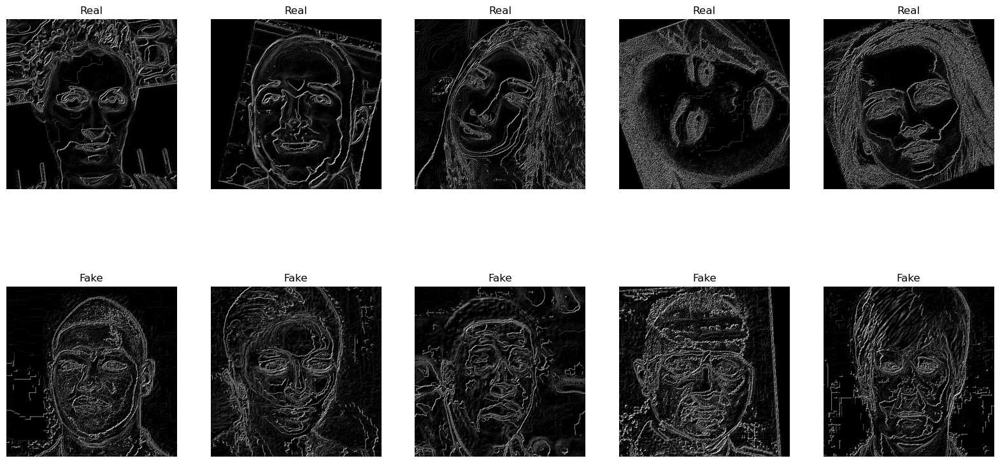

In [3]:
class ImageProcessor:
    def __init__(self, normalization_technique='divide_by_255'):
        self.normalization_technique = normalization_technique

    def load_and_normalize_image(self, path):
        """Load an image and normalize its pixel values"""
        img = mpimg.imread(path)
        
        if self.normalization_technique == 'divide_by_255':
            return img / 255.0
        elif self.normalization_technique == 'z_score':
            mean = np.mean(img, axis=(0, 1))
            std = np.std(img, axis=(0, 1))
            return (img - mean) / std
        elif self.normalization_technique == 'in_max':
            min_val = np.min(img)
            max_val = np.max(img)
            return (img - min_val) / (max_val - min_val)
        else:
            raise ValueError("Invalid normalization technique")

    def apply_gradient_edges_gray_scaler(self, img):
        """Apply Gradient Edges Gray Scaler to an image"""
        # Convert image to grayscale
        gray = cv2.cvtColor((img * 255).astype(np.uint8), cv2.COLOR_RGB2GRAY)
        
        # Apply Sobel operator to detect edges
        grad_x = cv2.Sobel(gray, cv2.CV_8U, 1, 0, ksize=3)
        grad_y = cv2.Sobel(gray, cv2.CV_8U, 0, 1, ksize=3)
        
        # Combine edges
        grad = cv2.addWeighted(grad_x, 0.5, grad_y, 0.5, 0)
        
        return grad / 255.0

class ImagePlotter:
    def __init__(self):
        pass

    def plot_images(self, axs, images, title, image_processor):
        """Plot a list of images on a set of axes"""
        for i, img_path in enumerate(images.sample(5)['path']):
            img = image_processor.load_and_normalize_image(img_path)
            img = image_processor.apply_gradient_edges_gray_scaler(img)  # Apply Gradient Edges Gray Scaler
            axs[i].imshow(img, cmap='gray')  # Display as grayscale image
            axs[i].set_title(title)
            axs[i].axis('off')

class ImageDisplayer:
    def __init__(self):
        pass

    def display_real_and_fake_images(self, real_images, fake_images, normalization_technique='divide_by_255'):
        """Display Real and Fake images in a 2x5 subplot"""
        fig, axs = plt.subplots(2, 5, figsize=(20, 10))
        image_processor = ImageProcessor(normalization_technique)
        image_plotter = ImagePlotter()
        image_plotter.plot_images(axs[0], real_images, 'Real', image_processor)
        image_plotter.plot_images(axs[1], fake_images, 'Fake', image_processor)
        plt.show()

normalization = train_label.copy()
normalization['target'] = normalization['target'].replace({0: 'Real', 1: 'Fake'})

real_images = normalization[normalization['target'] == 'Real']
fake_images = normalization[normalization['target'] == 'Fake']

normalization = ImageDisplayer()
normalization.display_real_and_fake_images(real_images, fake_images, normalization_technique='z_score')

# 3) Thermography

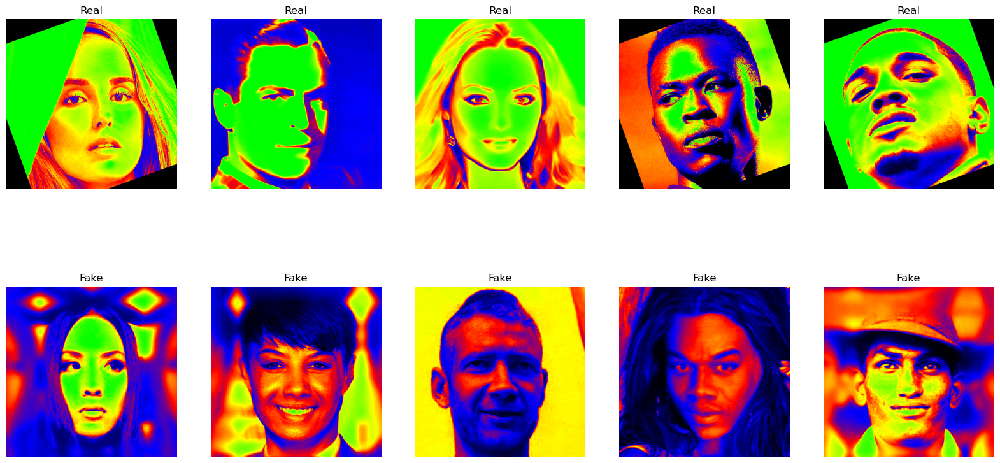

In [13]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
from matplotlib.colors import LinearSegmentedColormap

class InfraredImageProcessor:
    def __init__(self, train_set):
        self.train_set = train_set
        self.real_images = train_set[train_set['target'] == 'Real']
        self.fake_images = train_set[train_set['target'] == 'Fake']
        self.custom_cmap = self.create_custom_colormap()

    def create_custom_colormap(self):
        colors = [(0, 0, 0), (0, 0, 1), (1, 0, 0), (1, 1, 0), (0, 1, 0)]  # R -> B
        cmap_name = 'custom_infrared'
        return LinearSegmentedColormap.from_list(cmap_name, colors, N=350)

    def apply_custom_infrared_effect(self, img):
        img_gray = np.mean(img, axis=2)
        img_infrared = self.custom_cmap(img_gray / 255.0)
        return img_infrared

    def plot_images(self):
        fig, axs = plt.subplots(2, 5, figsize=(20, 10))

        for i, row in enumerate(self.real_images.sample(5).itertuples()):
            img_path = row.path
            img = mpimg.imread(img_path)
            img_infrared = self.apply_custom_infrared_effect(img)
            axs[0, i].imshow(img_infrared)
            axs[0, i].set_title('Real')
            axs[0, i].axis('off')

        for i, row in enumerate(self.fake_images.sample(5).itertuples()):
            img_path = row.path
            img = mpimg.imread(img_path)
            img_infrared = self.apply_custom_infrared_effect(img)
            axs[1, i].imshow(img_infrared)
            axs[1, i].set_title('Fake')
            axs[1, i].axis('off')

        plt.show()

# Example usage
if __name__ == "__main__":
    # Assuming train_set is a DataFrame with columns 'path' and 'target'
    processor = InfraredImageProcessor(train_set)
    processor.plot_images()

<a id="import"></a>
# <p style="background-color:#040404; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  Step 2 | Create The Model Training Data  </p>

<a id="import"></a>
# <p style="background-color:#c40c0c; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  1) Create Model CRIML = Hybrid(CNN+RNN) + Inception + MLMS  </p>

In [7]:
def load_and_preprocess_image(image_path, size=(128, 128)):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, size)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img / 255.0
    return img

X = []
Y = []

for index, row in train_label.iterrows():
    if 'path' in row:
        img_path = row['path']
        label = row['target']
        img = load_and_preprocess_image(img_path)
        if img is None:
            continue
        X.append(img)
        Y.append(label)

X = np.array(X)
Y = np.array(Y)

label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(Y)

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True)

X_train = X_train.reshape(-1, 128, 128, 1)
X_val = X_val.reshape(-1, 128, 128, 1)

Y_train = to_categorical(Y_train, num_classes=2)
Y_val = to_categorical(Y_val, num_classes=2)

from tensorflow.keras import layers, Model

def build_cnn_rnn_model():
    inputs = layers.Input(shape=(128, 128, 1))
    
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same')(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same')(x)
    x = layers.MaxPooling2D((2, 2))(x)
    
    x = layers.Reshape((16, 16 * 128))(x)
    
    x = layers.LSTM(128, return_sequences=True)(x)
    x = layers.LSTM(64)(x)
    
    outputs = layers.Dense(2, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    return model

cnn_rnn_model = build_cnn_rnn_model()
cnn_rnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
cnn_rnn_model.fit(X_train, Y_train, epochs=10, batch_size=32, validation_data=(X_val, Y_val))


from tensorflow.keras.applications.inception_v3 import InceptionV3, preprocess_input
from tensorflow.keras.layers import Dense, GlobalAveragePooling2D

def load_and_preprocess_image_inception(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, (299, 299))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = preprocess_input(img)
    return img

X_inception = []
Y_inception = []

for index, row in train_label.iterrows():
    if 'path' in row:
        img_path = row['path']
        label = row['target']
        img = load_and_preprocess_image_inception(img_path)
        if img is None:
            continue
        X_inception.append(img)
        Y_inception.append(label)

X_inception = np.array(X_inception)
Y_inception = np.array(Y_inception)

X_train_inception, X_val_inception, Y_train_inception, Y_val_inception = train_test_split(X_inception, Y_inception, test_size=0.2, random_state=42, shuffle=True)

Y_train_inception = to_categorical(Y_train_inception, num_classes=2)
Y_val_inception = to_categorical(Y_val_inception, num_classes=2)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

inception_model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

inception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
inception_model.fit(X_train_inception, Y_train_inception, epochs=10, batch_size=32, validation_data=(X_val_inception, Y_val_inception))


# Extract features from CNN-RNN model
cnn_rnn_features_train = cnn_rnn_model.predict(X_train)
cnn_rnn_features_val = cnn_rnn_model.predict(X_val)

# Extract features from Inception model
inception_features_train = inception_model.predict(X_train_inception)
inception_features_val = inception_model.predict(X_val_inception)

# Combine features
combined_features_train = np.concatenate([cnn_rnn_features_train, inception_features_train], axis=1)
combined_features_val = np.concatenate([cnn_rnn_features_val, inception_features_val], axis=1)

from sklearn.svm import SVC
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import StandardScaler

classifiers = {
    "SVM": make_pipeline(StandardScaler(), SVC(probability=True)),
    "RandomForest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "NaiveBayes": GaussianNB()
}

for name, clf in classifiers.items():
    clf.fit(combined_features_train, np.argmax(Y_train, axis=1))
    
    
from sklearn.ensemble import VotingClassifier

ensemble = VotingClassifier(estimators=list(classifiers.items()), voting='soft')
ensemble.fit(combined_features_train, np.argmax(Y_train, axis=1))

predictions = ensemble.predict(combined_features_val)
accuracy = accuracy_score(np.argmax(Y_val, axis=1), predictions)
print(f"Voting Accuracy : {accuracy * 100:.2f}%")   # output Voting Accuracy : 98.92% 

Epoch 1/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 50s 433ms/step - accuracy: 0.6684 - loss: 0.5492 - val_accuracy: 0.8313 - val_loss: 0.3685
Epoch 2/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 42s 401ms/step - accuracy: 0.8745 - loss: 0.2905 - val_accuracy: 0.9222 - val_loss: 0.2019
Epoch 3/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 41s 393ms/step - accuracy: 0.9028 - loss: 0.2318 - val_accuracy: 0.9199 - val_loss: 0.1985
Epoch 4/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 40s 384ms/step - accuracy: 0.9019 - loss: 0.2180 - val_accuracy: 0.9019 - val_loss: 0.2640
Epoch 5/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 44s 419ms/step - accuracy: 0.9079 - loss: 0.2270 - val_accuracy: 0.9330 - val_loss: 0.1695
Epoch 6/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 45s 432ms/step - accuracy: 0.9289 - loss: 0.1739 - val_accuracy: 0.9270 - val_loss: 0.1954
Epoch 7/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 44s 421ms/step - accuracy: 0.9394 - loss: 0.1742 - val_accuracy: 0.9414 - val_loss: 0.1480
Epoch 8/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 80s 398ms/step - accuracy: 0.9276 - loss: 0

# Reduce sensitivity to overfitting

In [14]:
def load_and_preprocess_image(image_path, size=(128, 128)):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, size)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    img = img / 255.0
    return img

X = []
Y = []

for index, row in train_label.iterrows():
    if 'path' in row:
        img_path = row['path']
        label = row['target']
        img = load_and_preprocess_image(img_path)
        if img is None:
            continue
        X.append(img)
        Y.append(label)

X = np.array(X)
Y = np.array(Y)

label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(Y)

X_train, X_val, Y_train, Y_val = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True)

X_train = X_train.reshape(-1, 128, 128, 1)
X_val = X_val.reshape(-1, 128, 128, 1)

Y_train = to_categorical(Y_train, num_classes=2)
Y_val = to_categorical(Y_val, num_classes=2)

# Data Augmentation
datagen = ImageDataGenerator(
    rotation_range=20,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    fill_mode='nearest'
)
datagen.fit(X_train)

def build_cnn_rnn_model():
    inputs = layers.Input(shape=(128, 128, 1))
    
    x = layers.Conv2D(32, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(inputs)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.25)(x)
    
    x = layers.Conv2D(64, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.25)(x)
    
    x = layers.Conv2D(128, (3, 3), activation='relu', padding='same', kernel_regularizer=l2(0.01))(x)
    x = layers.MaxPooling2D((2, 2))(x)
    x = layers.Dropout(0.25)(x)
    
    x = layers.Reshape((16, 16 * 128))(x)
    
    x = layers.LSTM(128, return_sequences=True, kernel_regularizer=l2(0.01))(x)
    x = layers.Dropout(0.25)(x)
    x = layers.LSTM(64, kernel_regularizer=l2(0.01))(x)
    x = layers.Dropout(0.25)(x)
    
    outputs = layers.Dense(2, activation='softmax')(x)
    
    model = Model(inputs, outputs)
    return model

cnn_rnn_model = build_cnn_rnn_model()
cnn_rnn_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Early Stopping and Reduce Learning Rate on Plateau
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.2, patience=3, min_lr=0.001)

history_cnn_rnn = cnn_rnn_model.fit(datagen.flow(X_train, Y_train, batch_size=32),
                                    epochs=50,
                                    validation_data=(X_val, Y_val),
                                    callbacks=[early_stopping, reduce_lr])

def load_and_preprocess_image_inception(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return None
    img = cv2.resize(img, (299, 299))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = preprocess_input(img)
    return img

X_inception = []
Y_inception = []

for index, row in train_label.iterrows():
    if 'path' in row:
        img_path = row['path']
        label = row['target']
        img = load_and_preprocess_image_inception(img_path)
        if img is None:
            continue
        X_inception.append(img)
        Y_inception.append(label)

X_inception = np.array(X_inception)
Y_inception = np.array(Y_inception)

X_train_inception, X_val_inception, Y_train_inception, Y_val_inception = train_test_split(X_inception, 
                                                                                          Y_inception, test_size=0.2,
                                                                                          random_state=42, shuffle=True)

Y_train_inception = to_categorical(Y_train_inception, num_classes=2)
Y_val_inception = to_categorical(Y_val_inception, num_classes=2)

base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))

x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(2, activation='softmax')(x)

inception_model = Model(inputs=base_model.input, outputs=predictions)

for layer in base_model.layers:
    layer.trainable = False

inception_model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
history_inception = inception_model.fit(X_train_inception, Y_train_inception, epochs=10, batch_size=32,
                                        validation_data=(X_val_inception, Y_val_inception))

# Extract features from CNN-RNN model
cnn_rnn_features_train = cnn_rnn_model.predict(X_train)
cnn_rnn_features_val = cnn_rnn_model.predict(X_val)

# Extract features from Inception model
inception_features_train = inception_model.predict(X_train_inception)
inception_features_val = inception_model.predict(X_val_inception)

# Combine features
combined_features_train = np.concatenate([cnn_rnn_features_train, inception_features_train], axis=1)
combined_features_val = np.concatenate([cnn_rnn_features_val, inception_features_val], axis=1)

classifiers = {
    "SVM": make_pipeline(StandardScaler(), SVC(probability=True)),
    "RandomForest": RandomForestClassifier(),
    "XGBoost": XGBClassifier(),
    "NaiveBayes": GaussianNB()
}

for name, clf in classifiers.items():
    clf.fit(combined_features_train, np.argmax(Y_train, axis=1))

ensemble = VotingClassifier(estimators=list(classifiers.items()), voting='soft')
ensemble.fit(combined_features_train, np.argmax(Y_train, axis=1))

predictions = ensemble.predict(combined_features_val)
accuracy = accuracy_score(np.argmax(Y_val, axis=1), predictions)

# Calculate and display performance ratios
for name, clf in classifiers.items():
    clf_predictions = clf.predict(combined_features_val)
    clf_accuracy = accuracy_score(np.argmax(Y_val, axis=1), clf_predictions)
    print(f"{name} Accuracy: {clf_accuracy * 100:.2f}%")

# Display the performance of the ensemble
print(f"Voting Accuracy: {accuracy * 100:.2f}%")

Epoch 1/50


C:\Users\islam\AppData\Roaming\Python\Python311\site-packages\keras\src\trainers\data_adapters\py_dataset_adapter.py:121: UserWarning: Your `PyDataset` class should call `super().__init__(**kwargs)` in its constructor. `**kwargs` can include `workers`, `use_multiprocessing`, `max_queue_size`. Do not pass these arguments to `fit()`, as they will be ignored.
  self._warn_if_super_not_called()


105/105 ━━━━━━━━━━━━━━━━━━━━ 63s 518ms/step - accuracy: 0.6186 - loss: 5.3665 - val_accuracy: 0.4641 - val_loss: 1.2126 - learning_rate: 0.0010
Epoch 2/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 59s 560ms/step - accuracy: 0.8077 - loss: 0.7227 - val_accuracy: 0.4641 - val_loss: 1.4264 - learning_rate: 0.0010
Epoch 3/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 53s 504ms/step - accuracy: 0.8155 - loss: 0.5670 - val_accuracy: 0.4940 - val_loss: 1.0088 - learning_rate: 0.0010
Epoch 4/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 59s 560ms/step - accuracy: 0.8485 - loss: 0.4765 - val_accuracy: 0.5490 - val_loss: 1.0082 - learning_rate: 0.0010
Epoch 5/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 60s 566ms/step - accuracy: 0.8408 - loss: 0.4507 - val_accuracy: 0.7524 - val_loss: 0.6086 - learning_rate: 0.0010
Epoch 6/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 59s 559ms/step - accuracy: 0.8585 - loss: 0.4108 - val_accuracy: 0.8062 - val_loss: 0.5626 - learning_rate: 0.0010
Epoch 7/50
105/105 ━━━━━━━━━━━━━━━━━━━━ 57s 538ms/step - accuracy: 0.8480 - loss:

In [5]:
cnn_rnn_model.summary()
inception_model.summary()


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 128, 128, 1)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d (Conv2D)                      │ (None, 128, 128, 32)        │             320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 64, 64, 32)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 64, 64, 64)          │          18,496 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 32, 32, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 32, 32, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_2 (Dropout)                  │ (None, 16, 16, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ reshape (Reshape)                    │ (None, 16, 2048)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm (LSTM)                          │ (None, 16, 128)             │       1,114,624 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_3 (Dropout)                  │ (None, 16, 128)             │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ lstm_1 (LSTM)                        │ (None, 64)                  │          49,408 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_4 (Dropout)                  │ (None, 64)                  │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 2)                   │             130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 3,770,504 (14.38 MB)

 Trainable params: 1,256,834 (4.79 MB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,513,670 (9.59 MB)

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1 (InputLayer)    │ (None, 299, 299, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_3 (Conv2D)             │ (None, 149, 149, 32)      │             864 │ input_layer_1[0][0]        │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization           │ (None, 149, 149, 32)      │              96 │ conv2d_3[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation (Activation)       │ (None, 149, 149, 32)      │               0 │ batch_normalization[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_4 (Conv2D)             │ (None, 147, 147, 32)      │           9,216 │ activation[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_1         │ (None, 147, 147, 32)      │              96 │ conv2d_4[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_1 (Activation)     │ (None, 147, 147, 32)      │               0 │ batch_normalization_1[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_5 (Conv2D)             │ (None, 147, 147, 64)      │          18,432 │ activation_1[0][0]         │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_2         │ (None, 147, 147, 64)      │             192 │ conv2d_5[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_2 (Activation)     │ (None, 147, 147, 64)      │               0 │ batch_normalization_2[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ max_pooling2d_3               │ (None, 73, 73, 64)        │               0 │ activation_2[0][0]         │
│ (MaxPooling2D)                │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_6 (Conv2D)             │ (None, 73, 73, 80)        │           5,120 │ max_pooling2d_3[0][0]      │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ batch_normalization_3         │ (None, 73, 73, 80)        │             240 │ conv2d_6[0][0]             │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ activation_3 (Activation)     │ (None, 73, 73, 80)        │               0 │ batch_normalization_3[0][… │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2d_7 (Conv2D)             │ (None, 71, 71, 192)       │         138,24

 Total params: 28,103,464 (107.21 MB)

 Trainable params: 2,100,226 (8.01 MB)

 Non-trainable params: 21,802,784 (83.17 MB)

 Optimizer params: 4,200,454 (16.02 MB)

<a id="import"></a>
# <p style="background-color:#c40c0c; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  2) Create Model  = Forensic Analysis Techniques + SIFT + INception  </p>

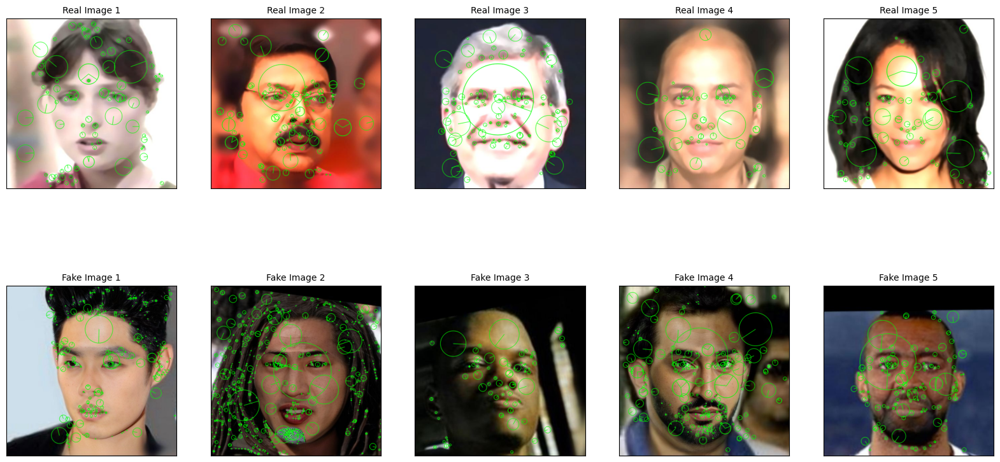

In [3]:
class SIFTFeatureExtractor:
    def __init__(self):
        self.sift = cv2.SIFT_create()

    def detect_and_draw_sift_features(self, image_path):
        image = cv2.imread(image_path)
        if image is None:
            print(f"Error: Unable to load image from path {image_path}")
            return None
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        keypoints, descriptors = self.sift.detectAndCompute(gray_image, None)
        drawn_image = cv2.drawKeypoints(image, keypoints, None, (0, 255, 0), 4)
        return drawn_image

class ImageProcessor:
    def __init__(self, image_paths):
        self.image_paths = image_paths
        self.sift_extractor = SIFTFeatureExtractor()

    def process_images(self):
        drawn_images = []
        for path in self.image_paths:
            image = self.sift_extractor.detect_and_draw_sift_features(path)
            if image is not None:
                drawn_images.append(image)
        return drawn_images

class ImagePlotter:
    def plot_images(self, axs, images, title):
        for i, image in enumerate(images):
            ax = axs[i]
            ax.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
            ax.set_title(f'{title} Image {i+1}', fontsize=10)
            ax.set_xticks([])
            ax.set_yticks([])

class ImageDisplayer:
    def __init__(self, drawn_images, targets):
        self.drawn_images = drawn_images
        self.targets = targets

    def display_real_and_fake_images(self):
        real_images = [image for image, target in zip(self.drawn_images, self.targets) if target == 'Real']
        fake_images = [image for image, target in zip(self.drawn_images, self.targets) if target == 'Fake']
        fig, axs = plt.subplots(2, 5, figsize=(20, 10))
        image_plotter = ImagePlotter()
        image_plotter.plot_images(axs[0], real_images[:5], 'Real')
        image_plotter.plot_images(axs[1], fake_images[:5], 'Fake')
        plt.show()

# Usage
SIFT = train_label.copy()
SIFT['target'] = SIFT['target'].replace({0: 'Real', 1: 'Fake'})

image_paths = SIFT['path']
targets = SIFT['target']

image_processor = ImageProcessor(image_paths)
drawn_images = image_processor.process_images()

SIFT = ImageDisplayer(drawn_images, targets)
SIFT.display_real_and_fake_images()

In [18]:
# Load and preprocess image function for InceptionV3
def load_and_preprocess_image_inception(image_path):
    img = cv2.imread(image_path)
    if img is None:
        return  None
    img = cv2.resize(img, (299, 299))  # Resize to 299x299
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)  # Convert to RGB
    img = preprocess_input(img)  # Preprocess for InceptionV3
    return img

# SIFT Feature Extractor
class SIFTFeatureExtractor:
    def __init__(self):
        self.sift = cv2.SIFT_create()

    def preprocess_image(self, image_path):
        image = cv2.imread(image_path)
        if image is None:
            return None
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
        keypoints, descriptors = self.sift.detectAndCompute(gray_image, None)
        if keypoints:
            x, y, w, h = cv2.boundingRect(cv2.KeyPoint_convert(keypoints))
            cropped_image = image[y:y+h, x:x+w]
            return cv2.resize(cropped_image, (128, 128))
        return cv2.resize(image, (128, 128))

# Load and preprocess dataset
def load_dataset(train_label):
    X_inception = []
    X_sift = []
    Y = []

    sift_extractor = SIFTFeatureExtractor()

    for index, row in train_label.iterrows():
        if 'path' in row:
            img_path = row['path']
            label = row['target']
            img_inception = load_and_preprocess_image_inception(img_path)
            img_sift = sift_extractor.preprocess_image(img_path)
            if img_inception is not None and img_sift is not None:
                X_inception.append(img_inception)
                X_sift.append(img_sift.flatten())
                Y.append(label)

    X_inception = np.array(X_inception)
    X_sift = np.array(X_sift)
    Y = np.array(Y)

    return X_inception, X_sift, Y

# Main function
def main():
    X_inception, X_sift, Y = load_dataset(train_label)

    # Split data
    X_inception_train, X_inception_val, X_sift_train, X_sift_val, Y_train, Y_val = train_test_split(
        X_inception, X_sift, Y, test_size=0.2, random_state=42, shuffle=True)

    # Convert labels to categorical
    Y_train = to_categorical(Y_train, num_classes=2)
    Y_val = to_categorical(Y_val, num_classes=2)

    # Train InceptionV3 model
    base_model = InceptionV3(weights='imagenet', include_top=False, input_shape=(299, 299, 3))
    x = base_model.output
    x = GlobalAveragePooling2D()(x)
    x = Dense(1024, activation='relu')(x)
    predictions = Dense(2, activation='softmax')(x)
    model = Model(inputs=base_model.input, outputs=predictions)
    for layer in base_model.layers:
        layer.trainable = False
    model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])
    model.fit(X_inception_train, Y_train, epochs=10, batch_size=32, validation_data=(X_inception_val, Y_val))

    # Extract features from InceptionV3
    X_inception_train_features = model.predict(X_inception_train)
    X_inception_val_features = model.predict(X_inception_val)

    # Combine features
    X_train_combined = np.hstack([X_inception_train_features, X_sift_train])
    X_val_combined = np.hstack([X_inception_val_features, X_sift_val])

    # Train classifiers
    svm_clf = SVC(probability=True)
    xgb_clf = XGBClassifier()
    rf_clf = RandomForestClassifier()
    nb_clf = GaussianNB()

    svm_clf.fit(X_train_combined, np.argmax(Y_train, axis=1))
    xgb_clf.fit(X_train_combined, np.argmax(Y_train, axis=1))
    rf_clf.fit(X_train_combined, np.argmax(Y_train, axis=1))
    nb_clf.fit(X_train_combined, np.argmax(Y_train, axis=1))

    # Voting Classifier
    voting_clf = VotingClassifier(
        estimators=[('svm', svm_clf), ('xgb', xgb_clf), ('rf', rf_clf), ('nb', nb_clf)],
        voting='soft')
    voting_clf.fit(X_train_combined, np.argmax(Y_train, axis=1))

    # Evaluate Voting Classifier
    Y_pred = voting_clf.predict(X_val_combined)
    accuracy = accuracy_score(np.argmax(Y_val, axis=1), Y_pred)
    print(f'Validation Accuracy: {accuracy * 100:.2f}%')

if __name__ == "__main__":
    main()

Epoch 1/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 591s 5s/step - accuracy: 0.7995 - loss: 0.6804 - val_accuracy: 0.9450 - val_loss: 0.1562
Epoch 2/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 548s 5s/step - accuracy: 0.9331 - loss: 0.1671 - val_accuracy: 0.9258 - val_loss: 0.1696
Epoch 3/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 506s 5s/step - accuracy: 0.9502 - loss: 0.1208 - val_accuracy: 0.9545 - val_loss: 0.1037
Epoch 4/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 456s 4s/step - accuracy: 0.9722 - loss: 0.0699 - val_accuracy: 0.9737 - val_loss: 0.0692
Epoch 5/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 491s 5s/step - accuracy: 0.9807 - loss: 0.0534 - val_accuracy: 0.9665 - val_loss: 0.0809
Epoch 6/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 451s 4s/step - accuracy: 0.9826 - loss: 0.0416 - val_accuracy: 0.9533 - val_loss: 0.1029
Epoch 7/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 475s 5s/step - accuracy: 0.9920 - loss: 0.0332 - val_accuracy: 0.9749 - val_loss: 0.0608
Epoch 8/10
105/105 ━━━━━━━━━━━━━━━━━━━━ 497s 5s/step - accuracy: 0.9940 - loss: 0.0240 - val_accu

<a id="import"></a>
# <p style="background-color:#c40c0c; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  3) Create Full One Hybrid Model = ( VGG16 + MobileNet + HOG )= Output is input to =>  Machine Learning Model= (SVM+RandomForest+XGB+Nive Bayse)) </p> </p>

In [1]:
import numpy as np
import cv2
import os
import pandas as pd
from skimage.feature import hog
from keras.applications.vgg16 import VGG16, preprocess_input as vgg16_preprocess
from keras.applications.mobilenet import MobileNet, preprocess_input as mobilenet_preprocess
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.ensemble import RandomForestClassifier, VotingClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import accuracy_score

def extract_vgg16_features(images):
    model = VGG16(weights='imagenet', include_top=False)
    features = []
    for img in images:
        img = cv2.resize(img, (224, 224))
        img = vgg16_preprocess(img)
        img = np.expand_dims(img, axis=0)
        feat = model.predict(img)
        features.append(feat.flatten())
    return np.array(features)

def extract_mobilenet_features(images):
    model = MobileNet(weights='imagenet', include_top=False)
    features = []
    for img in images:
        img = cv2.resize(img, (224, 224))
        img = mobilenet_preprocess(img)
        img = np.expand_dims(img, axis=0)
        feat = model.predict(img)
        features.append(feat.flatten())
    return np.array(features)

def extract_hog_features(images):
    features = []
    for img in images:
        img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
        img = cv2.resize(img, (64, 128))  # Resize to a common size for HOG
        feat, _ = hog(img, pixels_per_cell=(8, 8), cells_per_block=(2, 2), visualize=True)
        features.append(feat)
    return np.array(features)

# Define the paths to the real and fake image directories
train_real_dir = r"C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\Real"  # Real images label = 0
train_fake_dir = r"C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\Fake"  # Fake images label = 1

# Initialize lists to store the images and their labels
train_images = []
train_labels = []

# Load real images and their labels
for filename in os.listdir(train_real_dir):
    img_path = os.path.join(train_real_dir, filename)
    if os.path.isfile(img_path):  # Ensure it's a file
        img = cv2.imread(img_path)
        if img is not None:  # Ensure the image was read correctly
            img = cv2.resize(img, (224, 224))  # Resize to a common shape
            train_images.append(img)
            train_labels.append(0)  # Label for real images is 0

# Load fake images and their labels
for filename in os.listdir(train_fake_dir):
    img_path = os.path.join(train_fake_dir, filename)
    if os.path.isfile(img_path):  # Ensure it's a file
        img = cv2.imread(img_path)
        if img is not None:  # Ensure the image was read correctly
            img = cv2.resize(img, (224, 224))  # Resize to a common shape
            train_images.append(img)
            train_labels.append(1)  # Label for fake images is 1

# Create a DataFrame from the loaded images and labels
train_label = pd.DataFrame({
    'img_name': [os.path.basename(filename) for filename in os.listdir(train_real_dir)] + 
                [os.path.basename(filename) for filename in os.listdir(train_fake_dir)],
    'target': train_labels
})

# Write metadata to CSV
csv_path = r'C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\file_path6.csv'

# Ensure the 'target' column is of the correct data type
train_label['target'] = train_label['target'].astype(int)

# Construct the 'path' column based on the 'target' column
train_label['path'] = train_label.apply(
    lambda row: os.path.join(train_real_dir, row['img_name']) 
    if row['target'] == 0 
    else os.path.join(train_fake_dir, row['img_name']), 
    axis=1
)

# Save the DataFrame to a CSV file
train_label.to_csv(csv_path, index=False)

# Print first 10 rows for verification
train_label.head(10)

# Convert lists to numpy arrays
X = np.array(train_images)
Y = np.array(train_labels)

label_encoder = LabelEncoder()
Y = label_encoder.fit_transform(Y)

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2, random_state=42, shuffle=True)

def process_images_in_batches(train_label, batch_size=32):
    all_vgg16_features = []
    all_mobilenet_features = []
    all_hog_features = []
    
    num_batches = len(train_label) // batch_size + 1
    
    for i in range(num_batches):
        start_idx = i * batch_size
        end_idx = (i + 1) * batch_size
        batch_paths = train_label['path'][start_idx:end_idx]
        batch_images = [cv2.imread(path) for path in batch_paths]
        
        vgg16_features = extract_vgg16_features(batch_images)
        mobilenet_features = extract_mobilenet_features(batch_images)
        hog_features = extract_hog_features(batch_images)
        
        all_vgg16_features.append(vgg16_features)
        all_mobilenet_features.append(mobilenet_features)
        all_hog_features.append(hog_features)
    
    return np.vstack(all_vgg16_features), np.vstack(all_mobilenet_features), np.vstack(all_hog_features)

# Process images in batches
batch_size = 32
vgg16_features, mobilenet_features, hog_features = process_images_in_batches(train_label, batch_size)

# Combine features
combined_features = np.hstack((vgg16_features, mobilenet_features, hog_features))

# Split features into training and testing sets
X_train_features, X_test_features, Y_train, Y_test = train_test_split(combined_features, Y, test_size=0.2, random_state=42, shuffle=True)

svm_clf = SVC(probability=True)
xgb_clf = XGBClassifier()
rf_clf = RandomForestClassifier()
nb_clf = GaussianNB()

svm_clf.fit(X_train_features, Y_train)
xgb_clf.fit(X_train_features, Y_train)
rf_clf.fit(X_train_features, Y_train)
nb_clf.fit(X_train_features, Y_train)

1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 930ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 792ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━

C:\Users\islam\AppData\Local\Temp\ipykernel_9760\148264124.py:28: UserWarning: `input_shape` is undefined or non-square, or `rows` is not in [128, 160, 192, 224]. Weights for input shape (224, 224) will be loaded as the default.
  model = MobileNet(weights='imagenet', include_top=False)


1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 83ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 84ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 680ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 658ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 673ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 670ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 708ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 714ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 556ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 595ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 587ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 549ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 541ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 580ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 650ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 835ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 904ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 869ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 687ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 692ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 676ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 576ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 969ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 889ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 822ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 874ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 803ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 834ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 854ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 821ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 928ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 955ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 855ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 94ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 75ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 780ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 731ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 753ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 720ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 612ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 605ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 36ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 907ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 655ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 828ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 950ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 886ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 684ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 919ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 906ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 820ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 737ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 694ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 743ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 725ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 699ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 912ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 37ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 34ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 604ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 591ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 536ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 519ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 575ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 554ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 544ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 557ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 972ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 990ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 767ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 818ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 729ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 811ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 804ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 856ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 735ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 706ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/s

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 873ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 932ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 559ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 547ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 542ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 548ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 539ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 558ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 550ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 543ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 545ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 565ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 777ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 570ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 573ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
1/1 

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 703ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 715ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 644ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 701ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 867ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 727ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 674ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 836ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 177ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 785ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 691ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 791ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 936ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 862ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 632ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 819ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 782ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 949ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 793ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 585ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 571ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 579ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 586ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 594ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 713ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 876ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 693ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 581ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 985ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 896ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 898ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 665ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 615ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 741ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 825ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 700ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 712ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 732ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 596ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 601ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 608ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 617ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 752ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 618ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 779ms/s

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 607ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 675ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 32ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 734ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 600ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 598ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 611ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 614ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 633ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 646ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 636ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 602ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 764ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 959ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 893ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 938ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 634ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 33ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 738ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 809ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 769ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 925ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 669ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 652ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 661ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 647ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 656ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 653ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/st

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 698ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 995ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 915ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 914ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 885ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 678ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 923ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 816ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 999ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 686ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 786ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 948ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 765ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 840ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 790ms/step
1/1 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 697ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 891ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 951ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 704ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 894ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 937ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 899ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 759ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 599ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 71ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 159ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 788ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 658ms/step
1/1 ━━━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 839ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 965ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 768ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 829ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 944ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 802ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 852ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 846ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 864ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 987ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 815ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 746ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 657ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 659ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 645ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 648ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 683ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 778ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 679ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 48ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 39ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 881ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 685ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 663ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 664ms/step
1/1 ━━

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 971ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 671ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 920ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 845ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 775ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 643ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 639ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 668ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 690ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 783ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 719ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 956ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 49ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/s

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 45ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 35ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 50ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 46ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 51ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 755ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 569ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 705ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 629ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 606ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 660ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step
1/1

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 710ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 590ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 583ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 563ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 562ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 555ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 582ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 564ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 551ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 572ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 610ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 38ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 43ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 41ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 40ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 42ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 44ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/s

GaussianNB()

In [3]:
# Voting Classifier
voting_clf = VotingClassifier(
    estimators=[('svm', svm_clf), ('xgb', xgb_clf), ('rf', rf_clf), ('nb', nb_clf)],
    voting='soft')
voting_clf.fit(X_train_features, Y_train)

# Predict and evaluate
y_pred = voting_clf.predict(X_test_features)
accuracy = accuracy_score(Y_test, y_pred)
print(f"Accuracy: {accuracy * 100:.2f}%")

Accuracy: 97.49%


<a id="import"></a>

# <p style="background-color:#c40c0c; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:20px 30px;">  It's the qualifying stage for who is the best model  </p>
 



# Hybrid(CNN+RNN) + Inception + MLMS

In [9]:
# Calculate and display validation accuracy and loss for the ensemble
Y_pred_proba = ensemble.predict_proba(combined_features_val)
Y_pred_classes = np.argmax(Y_pred_proba, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)

ensemble_accuracy = accuracy_score(Y_true_classes, Y_pred_classes)
print(f'Validation Accuracy (Voting): {ensemble_accuracy * 100:.2f}%')

# Since the ensemble model does not have a direct loss function, we can calculate the log loss
from sklearn.metrics import log_loss
ensemble_loss = log_loss(Y_val, Y_pred_proba)
print(f'Validation Loss (Voting): {ensemble_loss:.3f}')

Validation Accuracy (Voting): 98.92%
Validation Loss (Voting): 0.051


# Plot training and validation accuracy vs epoch

Validation Accuracy (Voting): 98.56%
Validation Loss (Voting): 0.081
Classification Report:
              precision    recall  f1-score   support

        Real       1.00      0.98      0.99       448
        Fake       0.97      0.99      0.98       388

    accuracy                           0.99       836
   macro avg       0.99      0.99      0.99       836
weighted avg       0.99      0.99      0.99       836



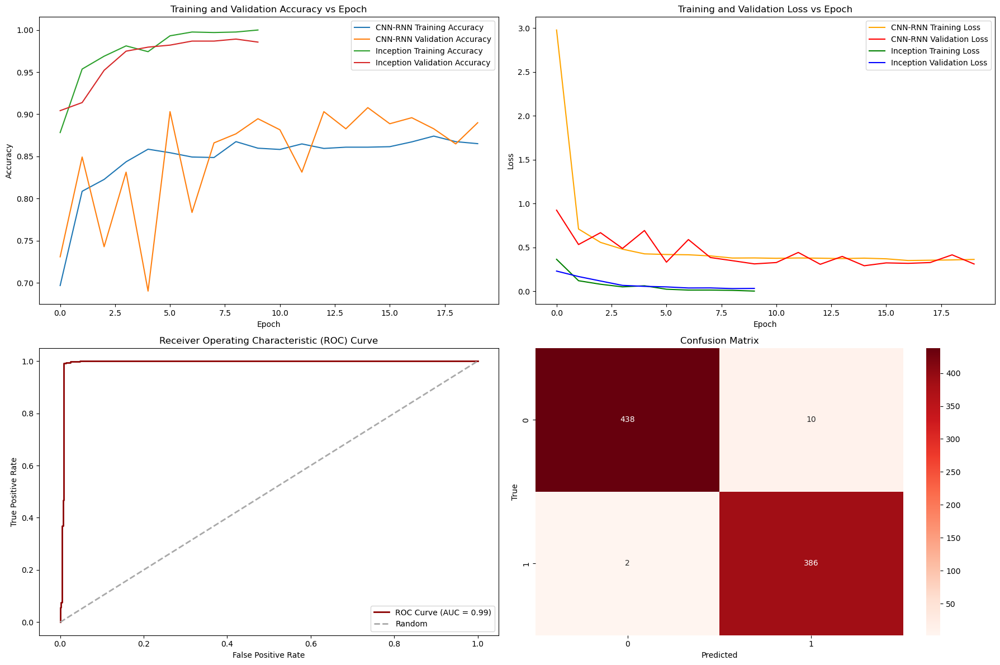

In [13]:
# Calculate and display validation accuracy and loss for the ensemble
Y_pred_proba = ensemble.predict_proba(combined_features_val)
Y_pred_classes = np.argmax(Y_pred_proba, axis=1)
Y_true_classes = np.argmax(Y_val, axis=1)

ensemble_accuracy = accuracy_score(Y_true_classes, Y_pred_classes)
print(f'Validation Accuracy (Voting): {ensemble_accuracy * 100:.2f}%')

ensemble_loss = log_loss(Y_val, Y_pred_proba)
print(f'Validation Loss (Voting): {ensemble_loss:.3f}')

# Plotting
plt.figure(figsize=(18, 12))

# Plot training and validation accuracy vs epoch
plt.subplot(2, 2, 1)
plt.plot(history_cnn_rnn.history['accuracy'], label='CNN-RNN Training Accuracy')
plt.plot(history_cnn_rnn.history['val_accuracy'], label='CNN-RNN Validation Accuracy')
plt.plot(history_inception.history['accuracy'], label='Inception Training Accuracy')
plt.plot(history_inception.history['val_accuracy'], label='Inception Validation Accuracy')
plt.title('Training and Validation Accuracy vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Plot training and validation loss vs epoch
plt.subplot(2, 2, 2)
plt.plot(history_cnn_rnn.history['loss'], label='CNN-RNN Training Loss', color='orange')
plt.plot(history_cnn_rnn.history['val_loss'], label='CNN-RNN Validation Loss', color='red')
plt.plot(history_inception.history['loss'], label='Inception Training Loss', color='green')
plt.plot(history_inception.history['val_loss'], label='Inception Validation Loss', color='blue')
plt.title('Training and Validation Loss vs Epoch')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

# Plot ROC Curve
plt.subplot(2, 2, 3)
y_pred_proba = ensemble.predict_proba(combined_features_val)[:, 1]
fpr, tpr, thresholds = roc_curve(np.argmax(Y_val, axis=1), y_pred_proba)
auc_value = auc(fpr, tpr)
plt.plot(fpr, tpr, color='darkred', lw=2, label=f'ROC Curve (AUC = {auc_value:.2f})')
plt.plot([0, 1], [0, 1], color='darkgray', lw=2, linestyle='--', label='Random')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.legend(loc='lower right')

# Plot Confusion Matrix
plt.subplot(2, 2, 4)
cm = confusion_matrix(np.argmax(Y_val, axis=1), predictions)
sns.heatmap(cm, annot=True, cmap='Reds', fmt='d')
plt.title('Confusion Matrix')
plt.xlabel('Predicted')
plt.ylabel('True')

# Classification Report
report = classification_report(np.argmax(Y_val, axis=1), predictions, target_names=['Real', 'Fake'])
print('Classification Report:')
print(report)

plt.tight_layout()
plt.show()

# To explain:

### The plots indicate that the model learns effectively from training data and generalizes well to evaluation data. There is a positive relationship between data augmentation and training ability and performance, indicating that the model is not overfitting. This indicates that the model is likely to perform well on unseen data, i.e. new data.

# Add Explainability to the model¶
Lets try to interpret the trained model on how it finds a image FAKE

!pip install lime

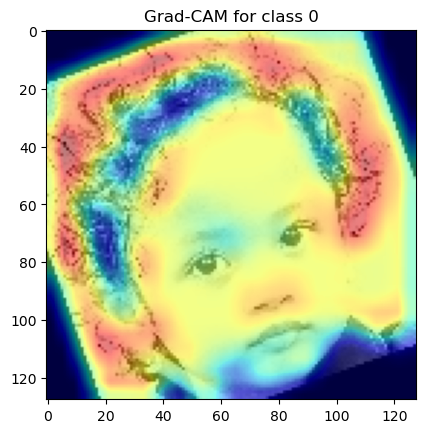

  0%|          | 0/5 [00:00<?, ?it/s]

C:\Users\islam\AppData\Roaming\Python\Python311\site-packages\shap\plots\_beeswarm.py:962: UserWarning: The figure layout has changed to tight
  pl.tight_layout()
C:\Users\islam\AppData\Roaming\Python\Python311\site-packages\shap\plots\_beeswarm.py:636: UserWarning: The figure layout has changed to tight
  pl.tight_layout(pad=0, w_pad=0, h_pad=0.0)


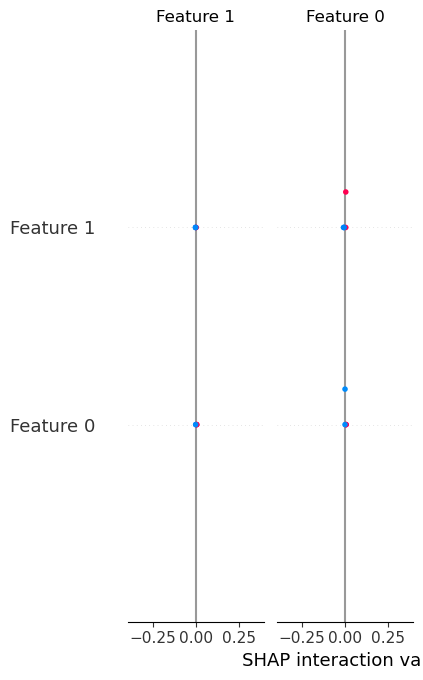

In [21]:
def visualize_grad_cam(model, img, class_idx, layer_name):
    grad_model = Model(inputs=model.inputs, 
                       outputs=[model.get_layer(layer_name).output, model.output])
    
    with tf.GradientTape() as tape:
        conv_outputs, predictions = grad_model(np.array([img]))
        loss = predictions[:, class_idx]
    
    output = conv_outputs[0]
    grads = tape.gradient(loss, conv_outputs)[0]
    
    weights = np.mean(grads, axis=(0, 1))
    cam = np.dot(output, weights)
    
    cam = np.maximum(cam, 0)
    cam = cv2.resize(cam, (128, 128))
    cam = cam / cam.max()
    
    return cam

# Example usage of Grad-CAM
img_idx = 5  # Choose a random image index
img = X_val[img_idx]
class_idx = np.argmax(Y_val[img_idx])

# Ensure the image is in the correct format (single-channel grayscale)
img = img.reshape(128, 128, 1)

# Visualize Grad-CAM for the last convolutional layer
# Corrected layer name
layer_name = 'conv2d_196'  # Update this to the correct layer name
cam = visualize_grad_cam(cnn_rnn_model, img, class_idx, layer_name=layer_name)

# Display the image with Grad-CAM overlay
plt.imshow(img.reshape(128, 128), cmap='gray')
plt.imshow(cam, alpha=0.5, cmap='jet')
plt.title(f"Grad-CAM for class {class_idx}")
plt.show()

# Create a SHAP explainer for the ensemble model
explainer = shap.KernelExplainer(ensemble.predict_proba, combined_features_train[:50])

# Calculate SHAP values for a few validation samples
shap_values = explainer.shap_values(combined_features_val[:5])

# Visualize SHAP values
shap.summary_plot(shap_values, combined_features_val[:5])

## شرح رسم بياني SHAP

**ما هو رسم بياني SHAP؟**

رسم بياني SHAP (SHapley Additive exPlanations) هو أداة مرئية تستخدم لتفسير قرارات نماذج التعلم الآلي، وخاصة نماذج التعلم الآلي المعقدة مثل الشبكات العصبية. يساعد هذا الرسم البياني على فهم كيف تؤثر كل ميزة (أو متغير مستقل) في البيانات على نتيجة التنبؤ النهائي.

**ما الذي يوضحه هذا الرسم البياني بالذات؟**

الرسم البياني الذي قدمته يوضح تأثير ميزتين (Feature 0 و Feature 1) على نتيجة التنبؤ. كل نقطة في الرسم البياني تمثل قيمة لشرح شابلي (SHAP value) لميزة معينة في مثال معين. قيم شرح شابلي تشير إلى مدى مساهمة كل ميزة في تغيير التنبؤ.

* **المحور الأفقي:** يمثل قيمة شرح شابلي. القيم الموجبة تعني أن الميزة زادت من احتمال حدوث التنبؤ، والقيم السالبة تعني أن الميزة قللت من احتمال حدوث التنبؤ.
* **المحور الرأسي:** يمثل الميزات المختلفة. في هذا المثال لدينا ميزتان: Feature 0 و Feature 1.
* **النقاط:** تمثل كل نقطة قيمة شرح شابلي لميزة معينة في مثال معين.
* **الخطوط الرأسية:** تمثل متوسط قيمة شرح شابلي لكل ميزة عبر جميع الأمثلة.

**كيف نفسر هذا الرسم البياني؟**

* **تأثير الميزة:** إذا كانت معظم النقاط لميزة معينة موجودة على الجانب الموجب من المحور الأفقي، فهذا يعني أن هذه الميزة بشكل عام تزيد من احتمال حدوث التنبؤ. والعكس صحيح إذا كانت معظم النقاط موجودة على الجانب السالب.
* **تفاعل الميزات:** إذا كانت هناك علاقة بين موقع النقاط للميزتين، فهذا يشير إلى وجود تفاعل بين الميزتين. على سبيل المثال، إذا كانت قيمة شرح شابلي لميزة معينة تكون أعلى عندما تكون قيمة شرح شابلي للميزة الأخرى عالية أيضًا، فهذا يعني أن هاتين الميزتين تعملان معًا لتأثير على النتيجة.

**ماذا يمكننا أن نستنتج من هذا الرسم البياني؟**

بناءً على هذا الرسم البياني، يمكننا استنتاج ما يلي:

* **أهمية الميزات:** يمكننا مقارنة طول الخطوط الرأسية لتقدير أهمية كل ميزة. الميزة التي لها خط رأسي أطول لها تأثير أكبر على النتيجة.
* **اتجاه التأثير:** يمكننا معرفة ما إذا كانت الميزة تزيد أو تقلل من احتمال حدوث التنبؤ بناءً على موقع النقاط على المحور الأفقي.
* **التفاعلات بين الميزات:** يمكننا البحث عن أي أنماط في توزيع النقاط لتحديد ما إذا كانت هناك تفاعلات بين الميزات.

**لماذا هو مهم؟**

* **الشفافية:** يساعد في جعل نماذج التعلم الآلي أكثر شفافية وفهمًا.
* **تحسين النموذج:** يمكن استخدام هذه المعلومات لتحسين أداء النموذج عن طريق إزالة الميزات غير المهمة أو تعديل وزن الميزات المختلفة.
* **كشف التحيزات:** يمكن الكشف عن أي تحيزات موجودة في البيانات أو في النموذج نفسه.

**بشكل عام، رسوم بيانية SHAP هي أداة قيمة لفهم كيفية اتخاذ نماذج التعلم الآلي لقراراتها، مما يساعدنا على الثقة في نتائجها وتفسيرها بشكل أفضل.**

**هل لديك أي أسئلة أخرى؟**

**ملاحظة:** لتفسير أكثر دقة، نحتاج إلى معلومات إضافية مثل:
* **ما هي الميزات 0 و 1؟** (أي ما تمثلان في البيانات)
* **ما هو نوع المشكلة التي يحلها النموذج؟** (تصنيف، انحدار، إلخ)
* **ما هي الخوارزمية المستخدمة لبناء النموذج؟**

بمعرفة هذه المعلومات، يمكننا تقديم تفسير أكثر تفصيلاً.


This part of the code focuses on **interpreting the decisions made by the model**. Here's a breakdown of what each section does:

**1. Grad-CAM Visualization:**

* It chooses a random image (`img_idx`) from the validation set (`X_val`).
* It identifies the predicted class for that image (`class_idx`).
* It ensures the image format is compatible with the model (single-channel grayscale).
* It uses a technique called Grad-CAM (`visualize_grad_cam`) to analyze the last convolutional layer of the CNN-RNN model. Grad-CAM highlights areas in the image that contributed most to the model's prediction for that class.
* Finally, it displays the original image overlaid with the Grad-CAM heatmap, indicating which parts of the image the model focused on for classification.

**2. SHAP Explanations:**

* It creates a tool called a SHAP explainer (`explainer`) for the ensemble model. SHAP helps understand how different features (pixels in the image, in this case) contribute to the model's prediction.
* It calculates SHAP values for a few validation samples (`shap_values`). These values represent the impact of each feature on the model's prediction probability for a particular class.
* It visualizes the SHAP values using a summary plot (`shap.summary_plot`). This plot shows how much each feature (pixel) increased or decreased the model's prediction for a specific class.

**3. Displaying Validation Images:**

* This defines a function (`display_images`) that displays a random selection of images from the validation set along with their predicted labels.

**Overall, this section helps us understand the "inner workings" of the model.**

* Grad-CAM provides a visual clue about which parts of the image the model pays attention to for classification.
* SHAP explanations quantify the contribution of each feature (pixel) to the model's prediction, allowing us to see which parts of the image are most important for making a specific classification.

By analyzing these explanations, we can gain insights into how the model makes decisions and identify any potential biases or limitations.


# Make predictions and display original images

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 187ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 52ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 221ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 171ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 184ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 172ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 179ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 164ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 154ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 47ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 180ms/step


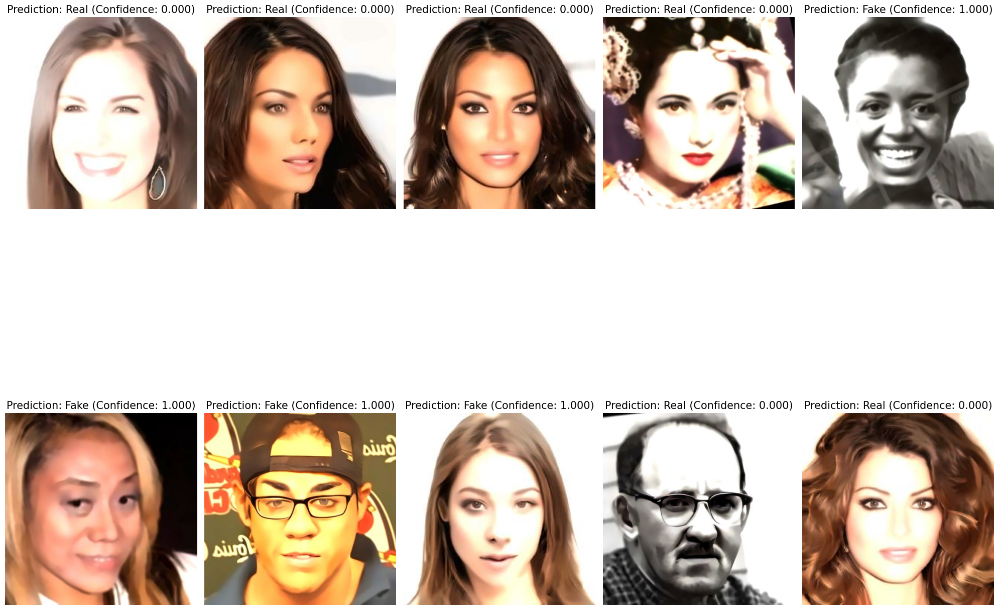

In [64]:
# Select 10 random images from X_val
selected_indices = np.random.choice(X_val.shape[0], 10, replace=False)
selected_images = X_val[selected_indices]

fig, axs = plt.subplots(2, 5, figsize=(20, 20))
for i, idx in enumerate(selected_indices):
    img = selected_images[i]
    img = np.expand_dims(img, axis=0)
    
    # Extract features from CNN-RNN model
    cnn_rnn_feature = cnn_rnn_model.predict(img)
    
    # Extract features from Inception model
    # Resize the image to (299, 299) and add the channel dimension
    resized_img = cv2.resize(img[0], (299, 299))
    resized_img = np.expand_dims(resized_img, axis=-1)
    resized_img = np.repeat(resized_img, 3, axis=-1)  # Repeat the single channel to create 3 channels
    inception_feature = inception_model.predict(np.expand_dims(resized_img, axis=0))
    
    # Combine features
    combined_feature = np.concatenate([cnn_rnn_feature, inception_feature], axis=1)
    
    prediction = ensemble.predict_proba(combined_feature)
    prediction_class = 'Real' if prediction[0][0] > 0.5 else 'Fake'

    # Load original image from file path
    original_img_path = train_label.iloc[idx]['path']
    original_img = cv2.imread(original_img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    # Display the original image with the prediction
    axs[i // 5, i % 5].imshow(original_img)
    axs[i // 5, i % 5].set_title(f'Prediction: {prediction_class} (Confidence: {prediction[0][1]:.3f})', fontsize=15)
    axs[i // 5, i % 5].axis('off')

plt.tight_layout()
plt.show()

<a id="import"></a>
# <p style="background-color:#040404; font-family:calibri; color:white; font-size:120%; text-align:center; border-radius:50px 50px;">  Step 5 | Z Application & Deployment   </p>


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step


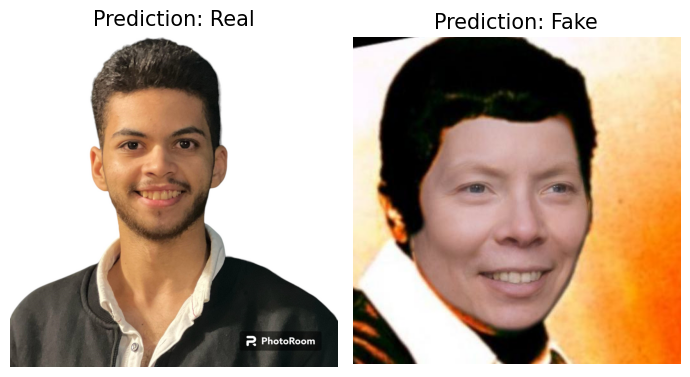

In [50]:
# Path to the new images
new_image_paths = [
    r"C:\Users\islam\Downloads\AI Work\deepfake\Yolov8\sd-Photoroom.jpg", # Frist Image
    
    
    r"C:\Users\islam\Downloads\AI Work\deepfake\training_fake\flipped_66eb418177cc2608e89e253e33ca4ceb.jpg" # Second Image 
]

# Function to preprocess and predict an image
def predict_image(image_path, model):
    # Load the new image in grayscale
    new_image_gray = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)

    # Check if the image is loaded correctly
    if new_image_gray is None:
        raise FileNotFoundError(f"Image not found or unable to load: {image_path}")

    new_image_gray = cv2.resize(new_image_gray, (128, 128))  # Resize to match model's input shape
    new_image_gray = np.expand_dims(new_image_gray, axis=-1)  # Add channel dimension
    new_image_gray = np.expand_dims(new_image_gray, axis=0)  # Add batch dimension
    new_image_gray = new_image_gray / 255.0  # Normalize

    # Make prediction
    prediction = model.predict(new_image_gray)
    prediction_class = 'Real' if prediction[0][0] > 0.5 else 'Fake'

    # Load the original image in color
    original_image = cv2.imread(image_path)

    # Check if the image is loaded correctly
    if original_image is None:
        raise FileNotFoundError(f"Image not found or unable to load: {image_path}")

    original_image = cv2.cvtColor(original_image, cv2.COLOR_BGR2RGB)  # Convert to RGB for display

    return original_image, prediction_class

# Display the original images with the predictions
fig, axs = plt.subplots(1, 2, figsize=(7, 5))

for i, image_path in enumerate(new_image_paths):
    original_image, prediction_class = predict_image(image_path, cnn_rnn_model)
    axs[i].imshow(original_image)
    axs[i].set_title(f'Prediction: {prediction_class}', fontsize=15)
    axs[i].axis('off')

plt.tight_layout()
plt.show()